# District Level Relationships with High School Math Benchmarks

** The following report uses EOG, EOC, and ACT benchmarks in Math summarized by NC school district to explore the relationships between educational attainment in Science and various school district statistics.  **

** Data Sources: **
* This report uses NC school district data from the 2016-2017 school year.
* Source code and details for the datasets are located here: 
 * https://github.com/jakemdrew/EducationDataNC/tree/master/2017/School%20Datasets

** Report Details: **
* Each report charts a single benchmark in Math summarized by school district with 42 district level variables considered for all school districts in North Carolina.  
* Individual regression lines are fit to each pairwise combination of income tax and school district variables. 
* Pearson correlation coefficients are calculated and all statistically significant relationships (p <= 0.05) are reported. 
* Kernel Density Estimates (KDE charts) are provided for the vertical and horizontal axis of each chart.  These show the estimated densities (PDF - Probability density functions) for individual values between the min and max value ranges of each variable.   

** Science Benchmarks Explored: **
* **ACTMath_ACTBenchmark_All** - The SCT Math benchmark for all high school students.
* **EOCMathI_CACR_All** - The End of Course College and Career Ready Math I benchmark for all high school students.
* **EOCMathI_GLP_All** - The End of Course Grade Level Proficiency Math I benchmark for all high school students.
* **EOCMathI_GLP_EDS** - The End of Course Grade Level Proficiency Math I benchmark for economically disadvantagesd high school students.
* **EOCMathI_GLP_SWD** - The End of Course Grade Level Proficiency Math I benchmark for high school students with disabilities.

## Cleaning Up the Data

In [10]:
#import required Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

year = '2017'
schoolDsName = 'PublicHighSchools2017.csv'

#Read in high school data
path='C:/Users/Jake/Documents/GitHub/EducationDataNC/' + year + '/School Datasets/' + schoolDsName
schoolData=pd.read_csv(path, low_memory=False)

In [11]:
#Isolate school district level columns
leaCols = schoolData.columns[schoolData.columns.str.lower().str.contains('lea_')]
distSchoolData = schoolData[leaCols]

#Get first non-null value for each district level field 
#(School district level data is duplicated for each campus in district)
distSchoolData = distSchoolData.groupby('Lea_Name').first()

#Inspect school district data fields selected
distSchoolData.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Index: 115 entries, Alamance-Burlington Schools to Yancey County Schools
Data columns (total 53 columns):
lea_avg_student_num               115 non-null float64
lea_total_expense_num             115 non-null float64
lea_salary_expense_pct            115 non-null float64
lea_benefits_expense_pct          0 non-null float64
lea_services_expense_pct          115 non-null float64
lea_supplies_expense_pct          115 non-null float64
lea_instruct_equip_exp_pct        115 non-null float64
lea_other_expense_pct             115 non-null float64
lea_federal_perpupil_num          115 non-null float64
lea_local_perpupil_num            115 non-null float64
lea_state_perpupil_num            115 non-null float64
lea_building_expense_pct          0 non-null float64
lea_sat_avg_score_num             114 non-null float64
lea_sat_participation_pct         114 non-null float64
lea_esea_attendance               0 non-null float64
lea_ap_participation_pct          89 

In [12]:
#Isolate Math benchmark columns
mathTotCols = schoolData.columns[schoolData.columns.str.contains('Math')
                              | schoolData.columns.str.contains('Math 1')
                              | schoolData.columns.str.contains('ACTMath_')
                              | schoolData.columns.str.contains('Lea_Name') ]
mathSchoolData = schoolData[mathTotCols]

#Get the mean Biology and Science benchmark scores by district.  
mathSchoolData = mathSchoolData.groupby('Lea_Name').mean()

#Inspect school district data fields selected
mathSchoolData.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Index: 115 entries, Alamance-Burlington Schools to Yancey County Schools
Data columns (total 228 columns):
Math I_Size                            float64
Math SPG Score                         float64
Math Score                             float64
NC Math 1 Score                        float64
Passing NC Math 3                      float64
ACTMath_ACTBenchmark_All               float64
EOCMathI_CACR_All                      float64
EOCMathI_GLP_All                       float64
EOGMathGr3_CACR_All                    float64
EOGMathGr3_GLP_All                     float64
EOGMathGr3-8_CACR_All                  float64
EOGMathGr3-8_GLP_All                   float64
EOGMathGr4_CACR_All                    float64
EOGMathGr4_GLP_All                     float64
EOGMathGr5_CACR_All                    float64
EOGMathGr5_GLP_All                     float64
EOGMathGr6_CACR_All                    float64
EOGMathGr6_GLP_All                     float64
EOGMathGr

In [13]:
print('*********************************Start: Merge Math and School District Data*********************************')
distSchoolData.info(verbose=False)
print(' ')
mathSchoolData.info(verbose=False)
print(' ')

#Merge profile and profileMetric data
distSchoolData = distSchoolData.merge(mathSchoolData,how='left',on='Lea_Name', suffixes=('', '_Drop'))

print('*********************************After: Merge Math and School District Data**************************')
distSchoolData.info(verbose=False)

*********************************Start: Merge Math and School District Data*********************************
<class 'pandas.core.frame.DataFrame'>
Index: 115 entries, Alamance-Burlington Schools to Yancey County Schools
Columns: 53 entries, lea_avg_student_num to 4-10 Years_LEA_Exp_Pct_Prin
dtypes: float64(53)
memory usage: 48.5+ KB
 
<class 'pandas.core.frame.DataFrame'>
Index: 115 entries, Alamance-Burlington Schools to Yancey County Schools
Columns: 228 entries, Math I_Size to MathGr3-8_pTarget_PctMet
dtypes: float64(228)
memory usage: 205.7+ KB
 
*********************************After: Merge Math and School District Data**************************
<class 'pandas.core.frame.DataFrame'>
Index: 115 entries, Alamance-Burlington Schools to Yancey County Schools
Columns: 281 entries, lea_avg_student_num to MathGr3-8_pTarget_PctMet
dtypes: float64(281)
memory usage: 253.4+ KB


## Visualizing District Level Features

In [14]:
#Create a function to plot regression lines for two variables
def PlotJoint(x,y,data):
    sns.set(context='notebook', style='darkgrid', font_scale=1.25)
    my_plot = sns.jointplot(x=x, y=y, data=data, kind="reg");
    my_plot.fig.set_figwidth(8)
    my_plot.fig.set_figheight(8)

In [15]:
#Make a list of 42 district level features to make plots for
leaCols = ['lea_avg_student_num', 'lea_total_expense_num',
           'lea_salary_expense_pct', 'lea_services_expense_pct', 
           'lea_supplies_expense_pct','lea_instruct_equip_exp_pct', 
           'lea_other_expense_pct', 'lea_federal_perpupil_num', 
           'lea_local_perpupil_num', 'lea_state_perpupil_num',
           'lea_sat_avg_score_num', 'lea_sat_participation_pct',
           'lea_ap_participation_pct', 'lea_ap_pct_3_or_above',
           'lea_ib_pct_4_or_above', 'lea_total_specialized_courses',
           'lea_ap_ib_courses', 'lea_cte_courses', 
           'lea_univ_college_courses', 'lea_avg_daily_attend_pct', 
           'lea_crime_per_c_num','lea_short_susp_per_c_num', 
           'lea_long_susp_per_c_num', 'lea_expelled_per_c_num', 
           'lea_stud_internet_comp_num', 'lea_avg_age_media_collection', 
           'lea_books_per_student', 'lea_wap_num', 
           'lea_wap_per_classroom', 'lea_flicensed_teach_pct',
           'lea_tchyrs_0thru3_pct', 'lea_tchyrs_4thru10_pct',
           'lea_tchyrs_11plus_pct', 'lea_class_teach_num', 
           'lea_nbpts_num', 'lea_advance_dgr_pct', 
           'lea_1yr_tchr_trnovr_pct', 'lea_emer_prov_teach_pct', 
           'lea_lateral_teach_pct', '0-3 Years_LEA_Exp_Pct_Prin',
           '10+ Years_LEA_Exp_Pct_Prin', '4-10 Years_LEA_Exp_Pct_Prin']

## District Level Relationships with the ACT Math Benchmark
** The following charts explore the relationship between a school district's average ACT Math benchmarks and various school district statistics.** 

**Key points to remember:** 
* Correlations are statistically significant at α = 0.05 or lower: they are (highly) unlikely and thus refute the null hypothesis of a zero population correlation.
* Correlations are never lower than -1. A correlation of -1 indicates that the data points in a scatter plot lie exactly on a straight descending line; the two variables are perfectly negatively linearly related.
* A correlation of 0 means that two variables don't have any linear relation whatsoever. However, some non linear relation may exist between the two variables.
* Correlation coefficients are never higher than 1. A correlation coefficient of 1 means that two variables are perfectly positively linearly related; the dots in a scatter plot lie exactly on a straight ascending line.
* 'Avg Tot Income' = 'Tot income Amt All' / 'Tot income Ct All'

**Key observations include statistically significant positive / negative correlations and are as follows: **
* District average student numbers increase as Average ACT Math Benchmark increases.
* District total expenses decrease as Average ACT Math Benchmark increases.
* District salaries as a percent of total expenses increase as Average ACT Math Benchmark increases.
* District services as a percent of total expenses decrease as Average ACT Math Benchmark increases.
* District supplies as a percent of total expenses decrease as Average ACT Math Benchmark increases.
* District federal funding per pupil decreases significantly as Average ACT Math Benchmark increases.
* District local funding per pupil increases as Average ACT Math Benchmark increases.
* District state funding per pupil decreases as Average ACT Math Benchmark increases.
* District average SAT scores increase significantly as Average ACT Math Benchmark increases.
* District AP participation percentages increase as Average ACT Math Benchmark increases.
* District AP pct 3 or above increases significantly as Average ACT Math Benchmark increases.
* District AP IB courses increase significantly as Average ACT Math Benchmark increases.
* District CTE courses decrease as Average ACT Math Benchmark increases.
* District univ college courses decrease as Average ACT Math Benchmark increases.
* District average daily attendance percentages increase as Average ACT Math Benchmark increases.
* District short term suspensions decrease as Average ACT Math Benchmark increases.
* District crime, long term suspensions, and expulsions do not appear to be correlated with Average ACT Math Benchmark changes. 
* District student internet connected computers increase as Average ACT Math Benchmark increases.
* The average age of a district's media collection increases as Average ACT Math Benchmark increases.
* District books per student decrease as Average ACT Math Benchmark increases. 
* District total wireless access points increase as Average ACT Math Benchmark increases.
* District total wireless access points per classroom decrease as Average ACT Math Benchmark increases.
* District fully licensed teachers increase as Average ACT Math Benchmark increases.
* District teachers with 0-3 years experience decreases as Average ACT Math Benchmark increases.
* District teachers with 4-10 years experience increase as Average ACT Math Benchmark increases.
* District teachers with 11+ years experience increase as Average ACT Math Benchmark increases.
* District class teacher numbers increase as Average ACT Math Benchmark increases.
* District average number of National Board Certified Staff increase as Average ACT Math Benchmark increases.
* District percentage of advanced degrees increase as Average ACT Math Benchmark increases.
* District one year teacher turnover decreases as Average ACT Math Benchmark increases.
* District emer prov teacher percentages decreases as Average ACT Math Benchmark increases.
* District lateral entry teacher percentages decrease significantly as Average ACT Math Benchmark increases.
* District principals with 0-3 years experience decreases as Average ACT Math Benchmark increases.
* District principals with 10+ years experience increases as Average ACT Math Benchmark increases.

### Click on the left side of the charts cell output below to expand all charts for viewing!

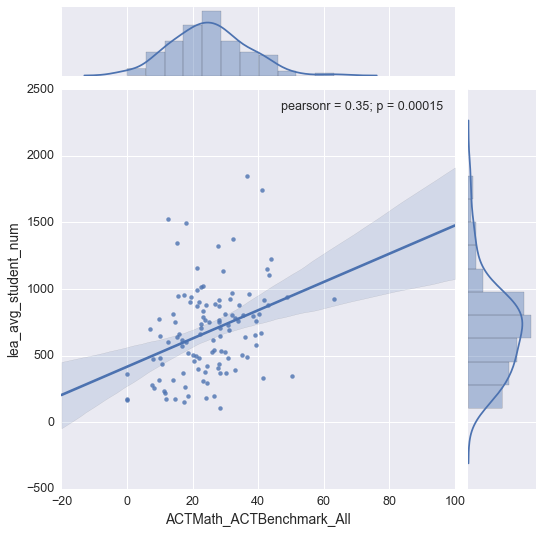

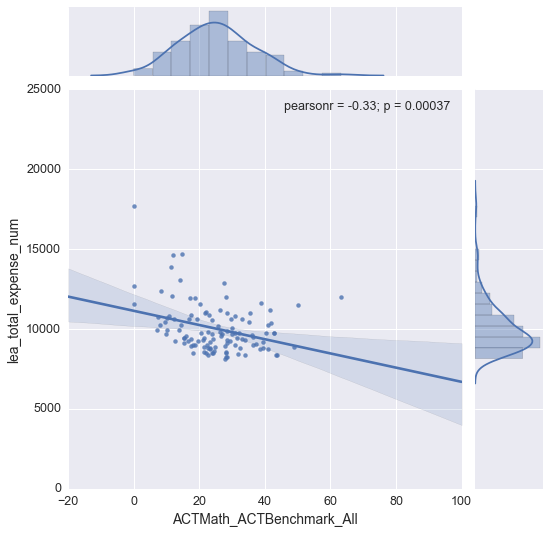

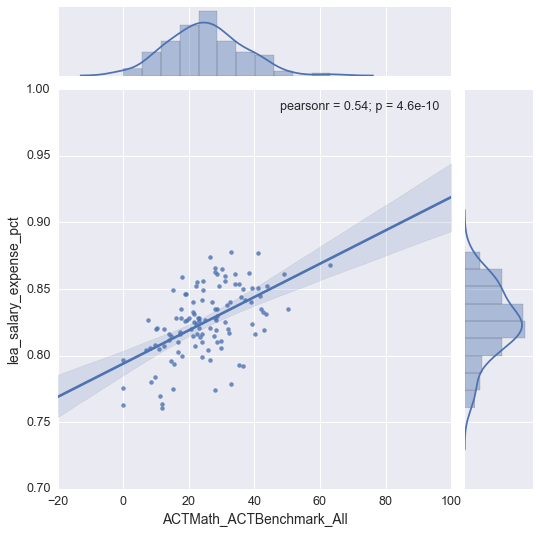

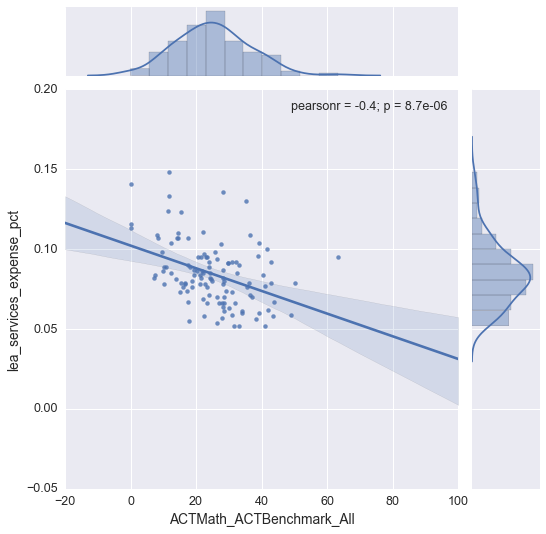

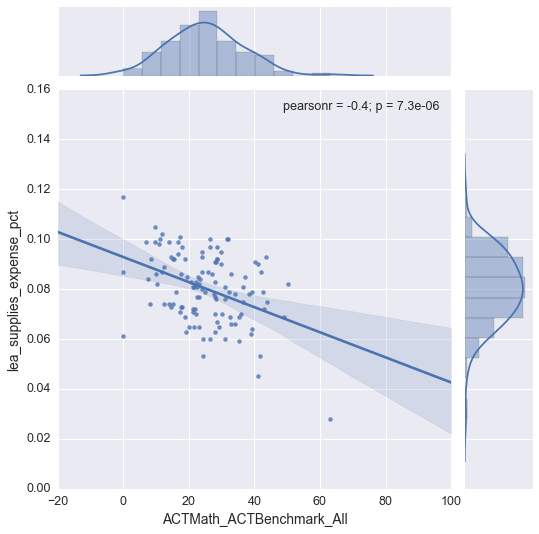

...

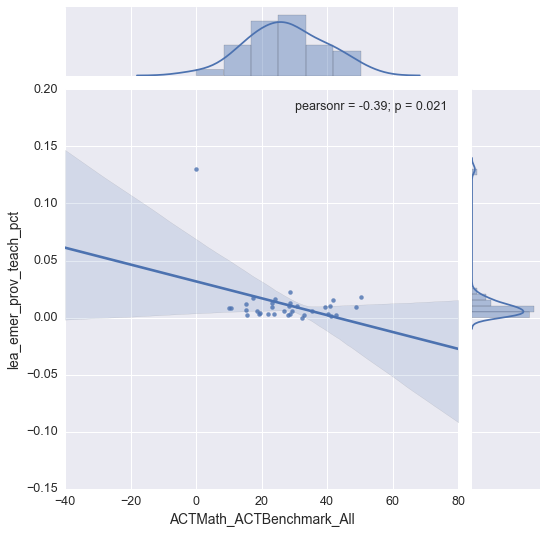

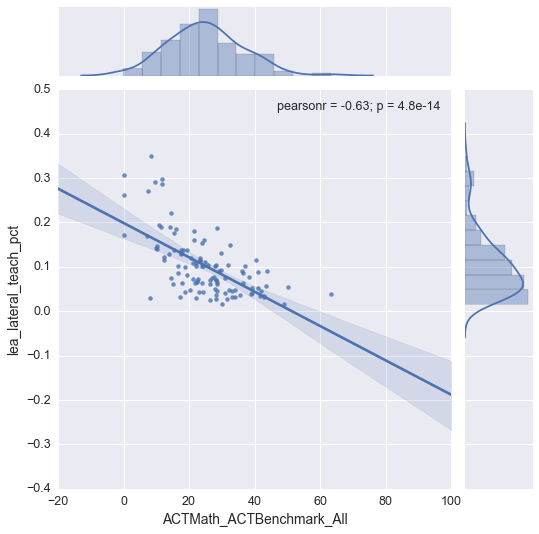

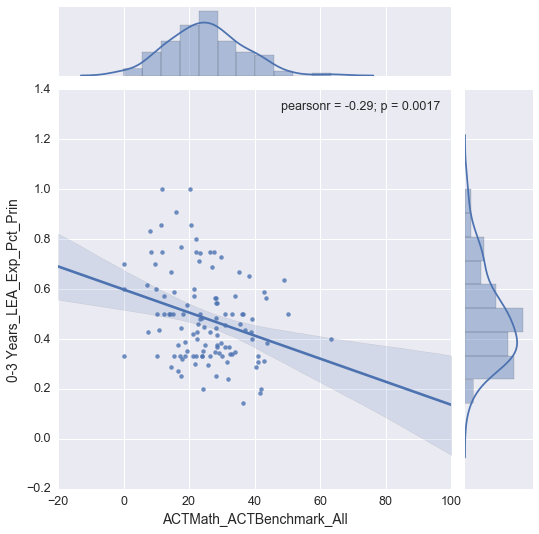

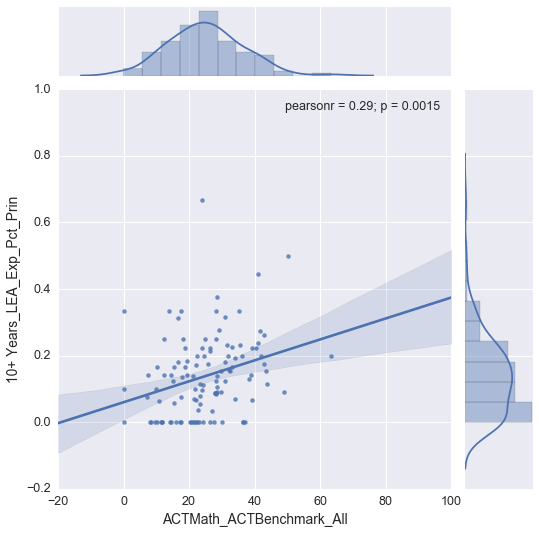

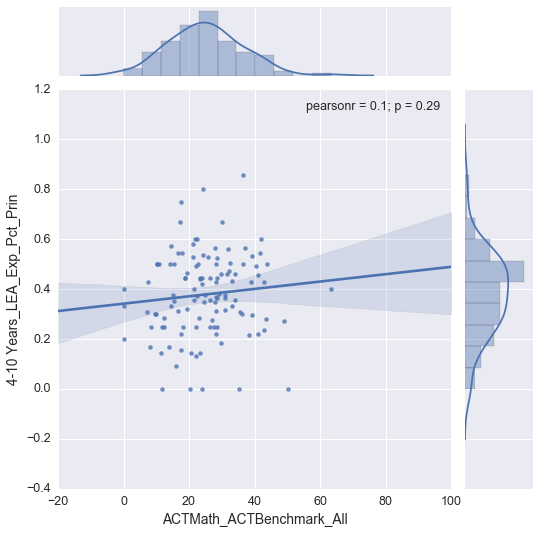

In [17]:
#Create district level charts to compare against Avg Tot Income
for col in leaCols:
    try:
        PlotJoint(x='ACTMath_ACTBenchmark_All',y=col, data=distSchoolData)
    except Exception:
        continue

## District Level Relationships with College and Career Ready (CACR) Math I Benchmarks
** The following charts explore the relationship between a school district's average College and Career Ready (CACR) Math Benchmarks and various school district statistics.** 

**Key points to remember:** 
* Correlations are statistically significant at α = 0.05 or lower: they are (highly) unlikely and thus refute the null hypothesis of a zero population correlation.
* Correlations are never lower than -1. A correlation of -1 indicates that the data points in a scatter plot lie exactly on a straight descending line; the two variables are perfectly negatively linearly related.
* A correlation of 0 means that two variables don't have any linear relation whatsoever. However, some non linear relation may exist between the two variables.
* Correlation coefficients are never higher than 1. A correlation coefficient of 1 means that two variables are perfectly positively linearly related; the dots in a scatter plot lie exactly on a straight ascending line.
* 'Avg Dependents Per Ret' = 'Number of dependents All' \ 'Number of returns All'


**Key observations include statistically significant positive / negative correlations and are as follows: **
* District average student numbers increase as End of Course College and Career Ready Math Benchmarks increases.
* District total expenses decrease as End of Course College and Career Ready Math Benchmarks increases.
* District salaries as a percent of total expenses increase as End of Course College and Career Ready Math Benchmarks increases.
* District services as a percent of total expenses decrease as End of Course College and Career Ready Math Benchmarks increases.
* District supplies as a percent of total expenses decrease as End of Course College and Career Ready Math Benchmarks increases.
* District federal funding per pupil decreases as End of Course College and Career Ready Math Benchmarks increases.
* District local funding per pupil increases as End of Course College and Career Ready Math Benchmarks increases.
* District state funding per pupil decreases as End of Course College and Career Ready Math Benchmarks increases.
* District average SAT scores increase significantly as End of Course College and Career Ready Math Benchmarks increases.
* District SAT participation percentages decrease as End of Course College and Career Ready Math Benchmarks increases.
* District AP participation percentages increase as End of Course College and Career Ready Math Benchmarks increases.
* District AP pct 3 or above increases as End of Course College and Career Ready Math Benchmarks increases.
* District AP IB courses increase as End of Course College and Career Ready Math Benchmarks increases.
* District CTE courses decrease as End of Course College and Career Ready Math Benchmarks increases.
* District average daily attendance percentages increase as End of Course College and Career Ready Math Benchmarks increases.
* District short term suspensions decrease as End of Course College and Career Ready Math Benchmarks increases.
* District crime, long term suspensions, and expulsions do not appear to be correlated with End of Course College and Career Ready Math Benchmarks changes. 
* District student internet connected computers increase as End of Course College and Career Ready Math Benchmarks increases.
* The average age of a district's media collection increases as End of Course College and Career Ready Math Benchmarks increases.
* District books per student decrease as End of Course College and Career Ready Math Benchmarks increases. 
* District fully licensed teachers increase as End of Course College and Career Ready Math Benchmarks increases.
* District teachers with 0-3 years experience decreases as End of Course College and Career Ready Math Benchmarks increases.
* District teachers with 4-10 years experience increase as End of Course College and Career Ready Math Benchmarks increases.
* District teachers with 11+ years experience increase as End of Course College and Career Ready Math Benchmarks increases.
* District class teacher numbers increase as End of Course College and Career Ready Math Benchmarks increases.
* District average number of National Board Certified Staff increase as End of Course College and Career Ready Math Benchmarks increases.
* District percentage of advanced degrees increase as End of Course College and Career Ready Math Benchmarks increases.
* District one year teacher turnover decreases as End of Course College and Career Ready Math Benchmarks increases.
* District lateral entry teacher percentages decrease significantly as End of Course College and Career Ready Math Benchmarks increases.
* District principals with 0-3 years experience decreases as End of Course College and Career Ready Math Benchmarks increases.
* District principals with 10+ years experience increases as End of Course College and Career Ready Math Benchmarks increases.

### Click on the left side of the charts cell output below to expand all charts for viewing!

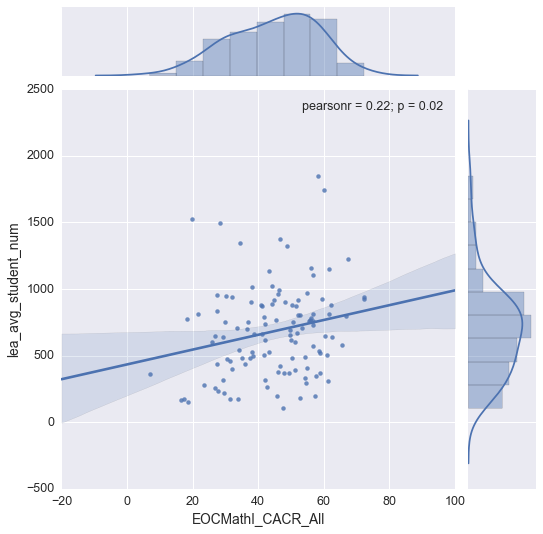

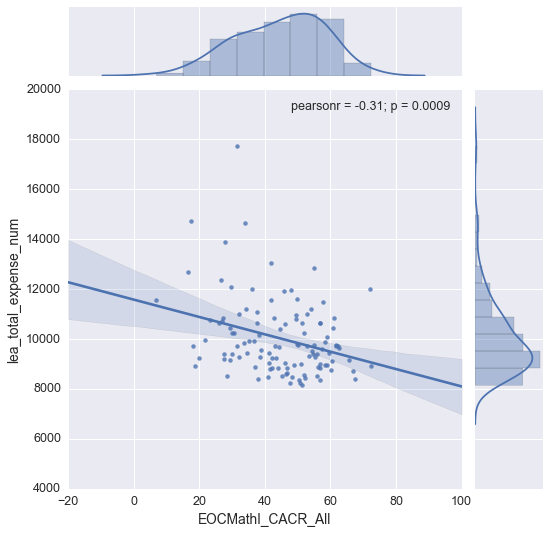

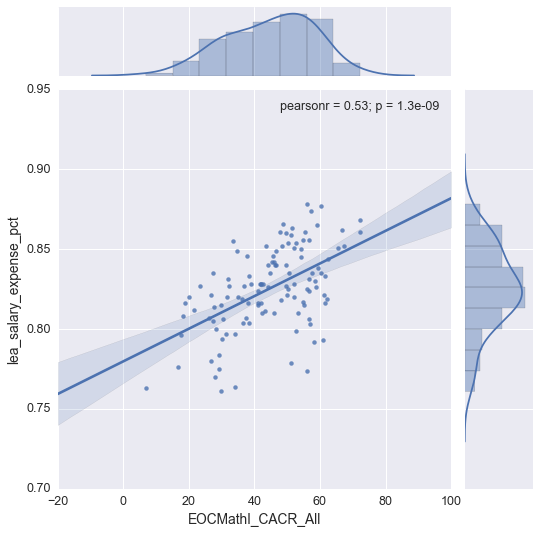

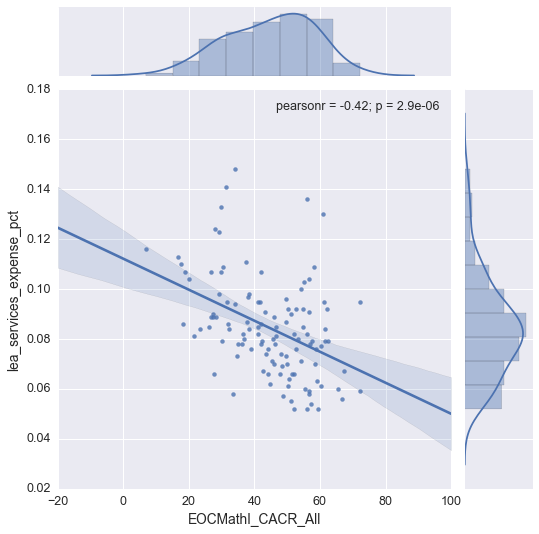

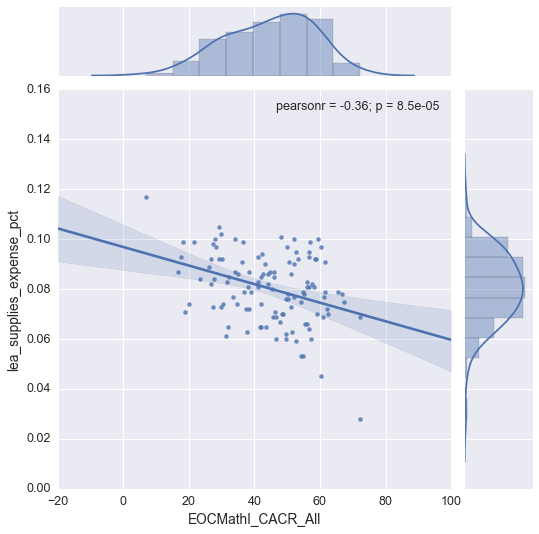

...

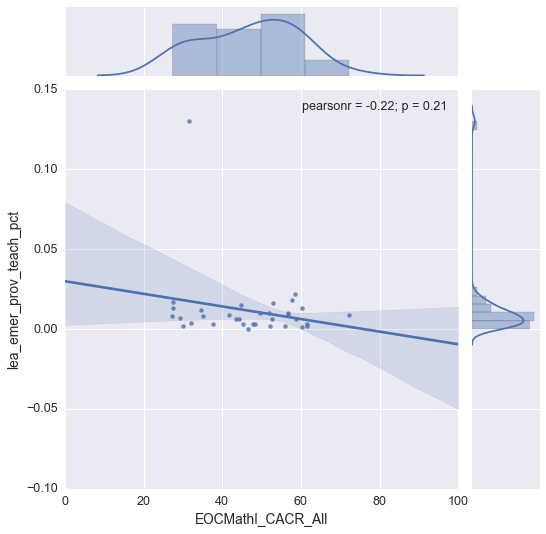

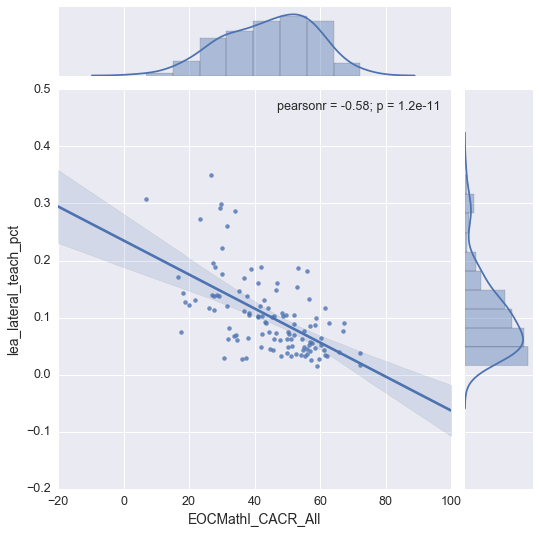

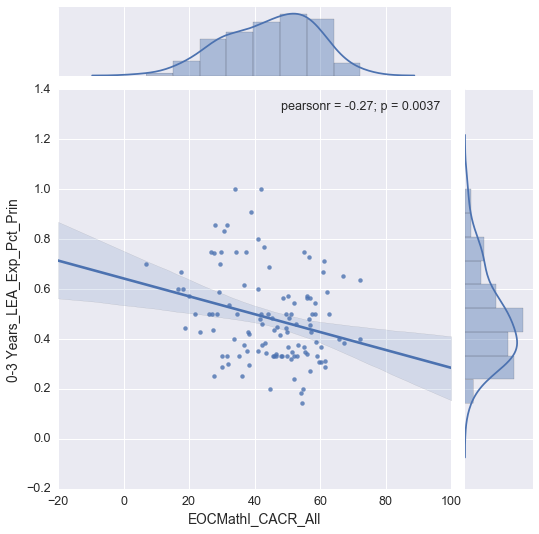

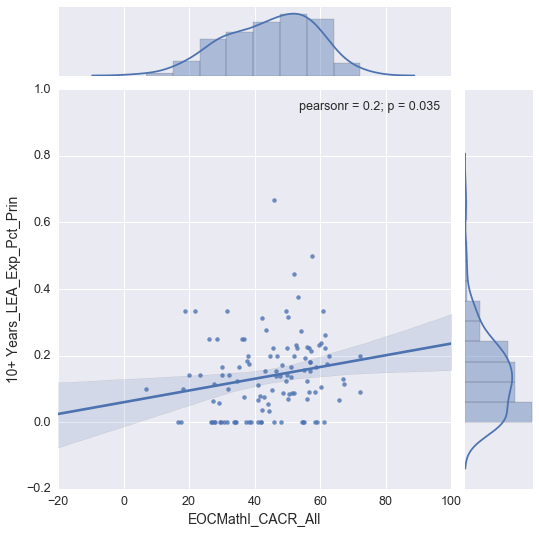

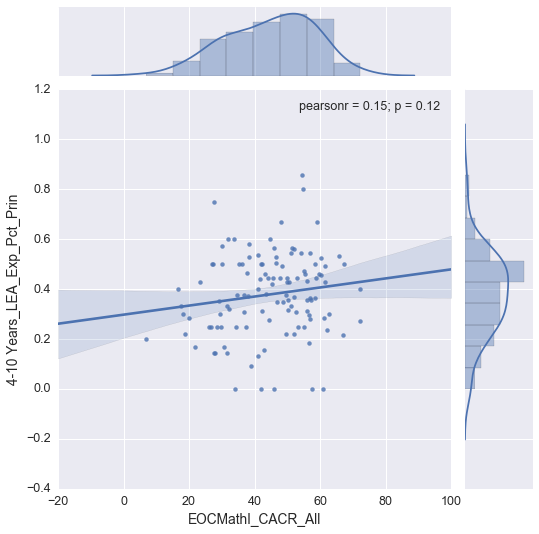

In [18]:
#Create district level charts to compare against number of dependents
for col in leaCols:
    try:
        PlotJoint(x='EOCMathI_CACR_All',y=col, data=distSchoolData)
    except Exception:
        continue

## District Level Relationships with Grade Level Proficiency (GLP) Math I Benchmarks
** The following charts explore the relationship between a school district's average Grade Level Proficiency (GLP) Math Benchmarks and various school district statistics.** 

**Key points to remember:** 
* Correlations are statistically significant at α = 0.05 or lower: they are (highly) unlikely and thus refute the null hypothesis of a zero population correlation.
* Correlations are never lower than -1. A correlation of -1 indicates that the data points in a scatter plot lie exactly on a straight descending line; the two variables are perfectly negatively linearly related.
* A correlation of 0 means that two variables don't have any linear relation whatsoever. However, some non linear relation may exist between the two variables.
* Correlation coefficients are never higher than 1. A correlation coefficient of 1 means that two variables are perfectly positively linearly related; the dots in a scatter plot lie exactly on a straight ascending line.
* Avg Personal Property Taxes = Personal property taxes Amt All / Personal property taxes Ct All

**Key observations include statistically significant positive / negative correlations and are as follows: **
* District total expenses decrease as Grade Level Proficiency (GLP) Math Benchmarks increases.
* District salaries as a percent of total expenses increase as Grade Level Proficiency (GLP) Math Benchmarks increases.
* District services as a percent of total expenses decrease as Grade Level Proficiency (GLP) Math Benchmarks increases.
* District supplies as a percent of total expenses decrease as Grade Level Proficiency (GLP) Math Benchmarks increases.
* District federal funding per pupil decreases significantly as Grade Level Proficiency (GLP) Math Benchmarks increases.
* District local funding per pupil increases as Grade Level Proficiency (GLP) Math Benchmarks increases.
* District state funding per pupil decreases as Grade Level Proficiency (GLP) Math Benchmarks increases.
* District average SAT scores increase significantly as Grade Level Proficiency (GLP) Math Benchmarks increases.
* District SAT participation percentages decrease as Grade Level Proficiency (GLP) Math Benchmarks increases.
* District AP participation percentages increase as Grade Level Proficiency (GLP) Math Benchmarks increases.
* District AP pct 3 or above increases as Grade Level Proficiency (GLP) Math Benchmarks increases.
* District AP IB courses increase as Grade Level Proficiency (GLP) Math Benchmarks increases.
* District CTE courses decrease as Grade Level Proficiency (GLP) Math Benchmarks increases.
* District average daily attendance percentages increase as Grade Level Proficiency (GLP) Math Benchmarks increases.
* District short term suspensions decrease as Grade Level Proficiency (GLP) Math Benchmarks increases.
* District crime, long term suspensions, and expulsions do not appear to be correlated with Grade Level Proficiency (GLP) Math Benchmarks changes. 
* District student internet connected computers increase as Grade Level Proficiency (GLP) Math Benchmarks increases.
* The average age of a district's media collection increases as Grade Level Proficiency (GLP) Math Benchmarks increases.
* District books per student decrease as Grade Level Proficiency (GLP) Math Benchmarks increases. 
* District fully licensed teachers increase as Grade Level Proficiency (GLP) Math Benchmarks increases.
* District teachers with 0-3 years experience decreases as Grade Level Proficiency (GLP) Math Benchmarks increases.
* District teachers with 4-10 years experience increase as Grade Level Proficiency (GLP) Math Benchmarks increases.
* District teachers with 11+ years experience increase as Grade Level Proficiency (GLP) Math Benchmarks increases.
* District average number of National Board Certified Staff increase as Grade Level Proficiency (GLP) Math Benchmarks increases.
* District percentage of advanced degrees increase as Grade Level Proficiency (GLP) Math Benchmarks increases.
* District one year teacher turnover decreases as Grade Level Proficiency (GLP) Math Benchmarks increases.
* District lateral entry teacher percentages decrease significantly as Grade Level Proficiency (GLP) Math Benchmarks increases.
* District principals with 0-3 years experience decreases as Grade Level Proficiency (GLP) Math Benchmarks increases.

### Click on the left side of the charts cell output below to expand all charts for viewing!

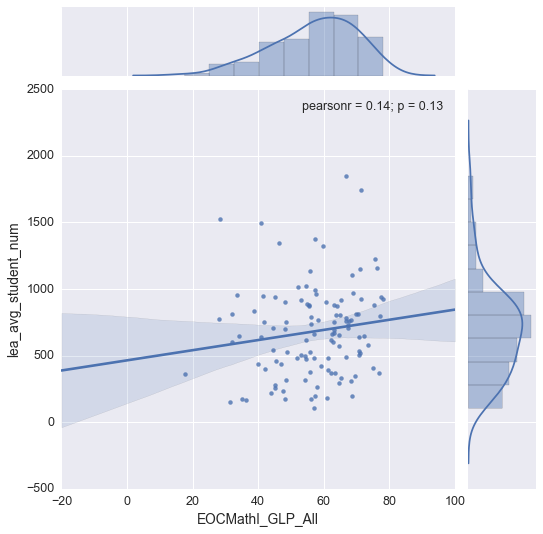

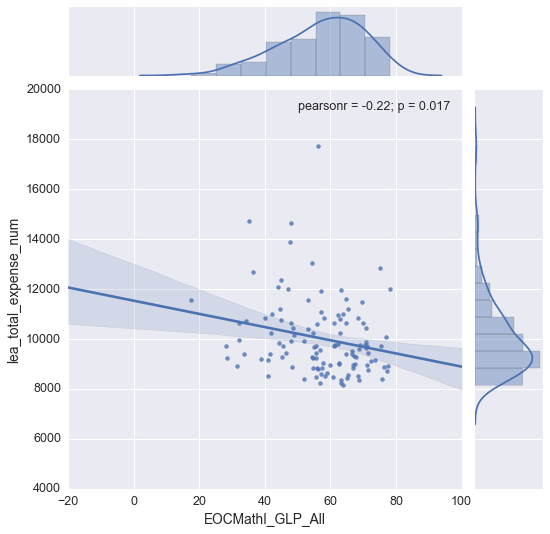

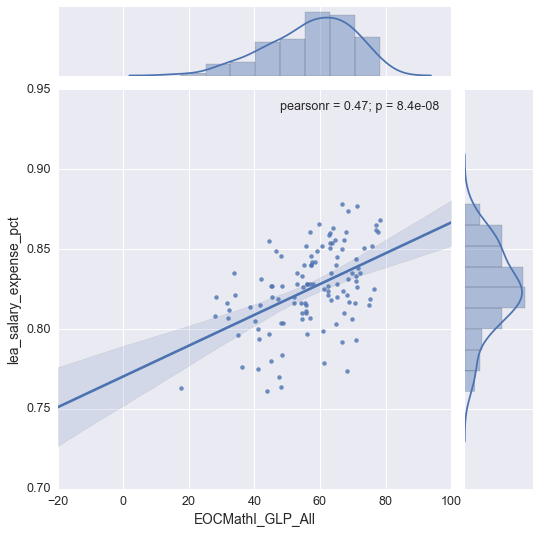

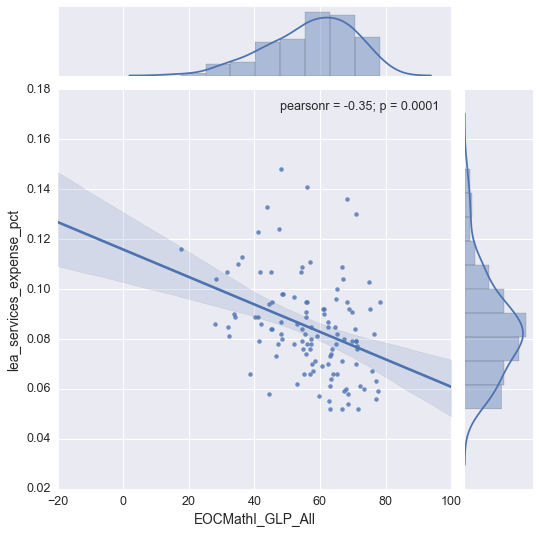

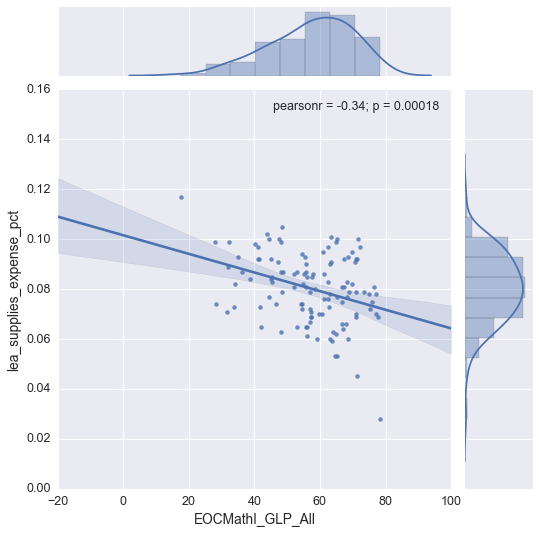

...

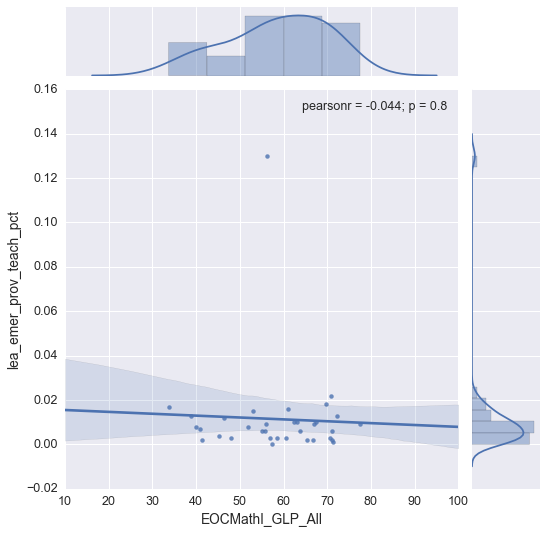

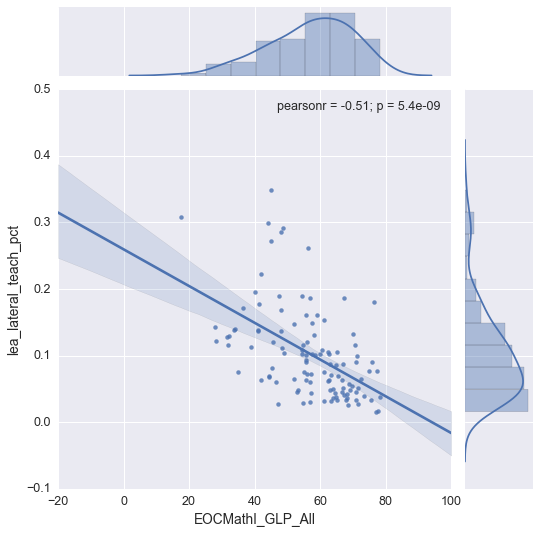

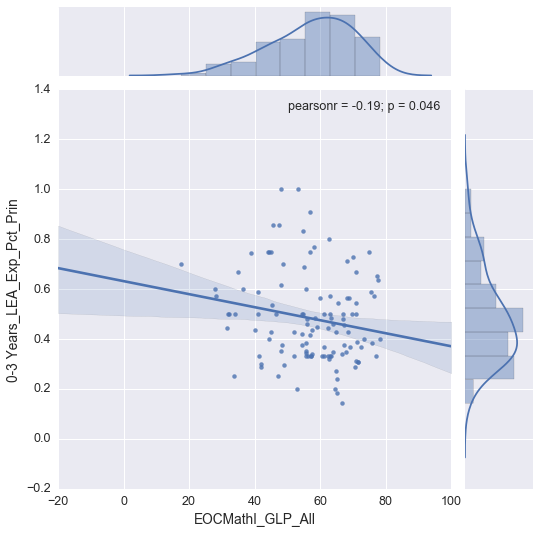

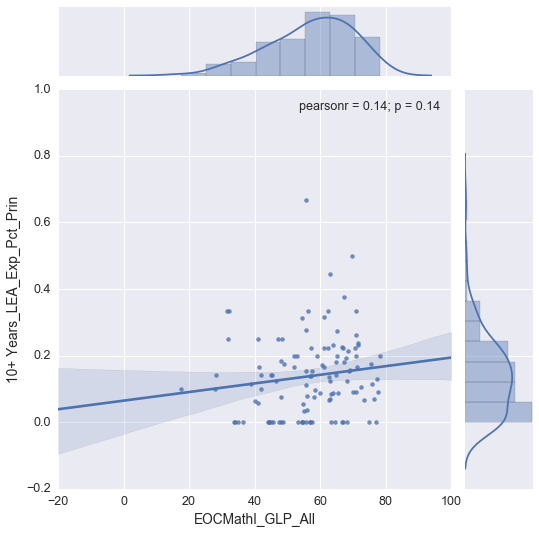

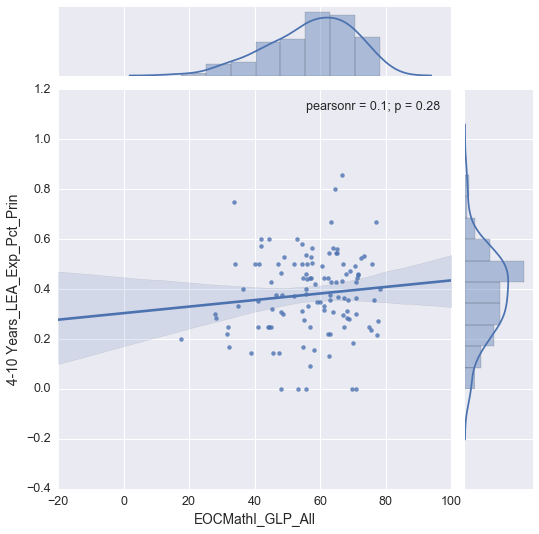

In [20]:
#Create district level charts to compare against number of dependents
for col in leaCols:
    try:
        PlotJoint(x='EOCMathI_GLP_All',y=col, data=distSchoolData)
    except Exception:
        continue

## District Level Relationships with Math I Grade Level Proficiency (GLP) for Economically Disadvantaged Students 
** The following charts explore the relationship between a school district's average Math I Grade Level Proficiency (GLP) Benchmarks for economically disadvantaged students and various school district statistics.** 


**Key points to remember:** 
* Correlations are statistically significant at α = 0.05 or lower: they are (highly) unlikely and thus refute the null hypothesis of a zero population correlation.
* Correlations are never lower than -1. A correlation of -1 indicates that the data points in a scatter plot lie exactly on a straight descending line; the two variables are perfectly negatively linearly related.
* A correlation of 0 means that two variables don't have any linear relation whatsoever. However, some non linear relation may exist between the two variables.
* Correlation coefficients are never higher than 1. A correlation coefficient of 1 means that two variables are perfectly positively linearly related; the dots in a scatter plot lie exactly on a straight ascending line.
* Pct of Farm Returns = Number of farm returns All / Number of returns All  

**Key observations include statistically significant positive / negative correlations and are as follows: **
* District total expenses decrease as Grade Level Proficiency (GLP) Math Benchmarks for economically disadvantaged students increases.
* District salaries as a percent of total expenses increase as Grade Level Proficiency (GLP) Math Benchmarks for economically disadvantaged students increases.
* District services as a percent of total expenses decrease as Grade Level Proficiency (GLP) Math Benchmarks for economically disadvantaged students increases.
* District federal funding per pupil decreases significantly as Grade Level Proficiency (GLP) Math Benchmarks for economically disadvantaged students increases.
* District state funding per pupil decreases as Grade Level Proficiency (GLP) Math Benchmarks for economically disadvantaged students increases.
* District average SAT scores increase as Grade Level Proficiency (GLP) Math Benchmarks for economically disadvantaged students increases.
* District SAT participation percentages decrease as Grade Level Proficiency (GLP) Math Benchmarks for economically disadvantaged students increases.
* District AP pct 3 or above increases as Grade Level Proficiency (GLP) Math Benchmarks for economically disadvantaged students increases.
* District average daily attendance percentages increase as Grade Level Proficiency (GLP) Math Benchmarks for economically disadvantaged students increases.
* District short term suspensions decrease as Grade Level Proficiency (GLP) Math Benchmarks for economically disadvantaged students increases.
* District crime, long term suspensions, and expulsions do not appear to be correlated with Grade Level Proficiency (GLP) Math Benchmarks for economically disadvantaged studentschanges. 
* The average age of a district's media collection increases as Grade Level Proficiency (GLP) Math Benchmarks for economically disadvantaged students increases.
* District books per student decrease as Grade Level Proficiency (GLP) Math Benchmarks for economically disadvantaged students increases. 
* District fully licensed teachers increase as Grade Level Proficiency (GLP) Math Benchmarks for economically disadvantaged students increases.
* District teachers with 0-3 years experience decreases as Grade Level Proficiency (GLP) Math Benchmarks for economically disadvantaged students increases.
* District teachers with 4-10 years experience increase as Grade Level Proficiency (GLP) Math Benchmarks for economically disadvantaged students increases.
* District teachers with 11+ years experience increase as Grade Level Proficiency (GLP) Math Benchmarks for economically disadvantaged students increases.
* District percentage of advanced degrees increase as Grade Level Proficiency (GLP) Math Benchmarks for economically disadvantaged students increases.
* District one year teacher turnover decreases as Grade Level Proficiency (GLP) Math Benchmarks for economically disadvantaged students increases.
* District lateral entry teacher percentages decrease as Grade Level Proficiency (GLP) Math Benchmarks for economically disadvantaged students increases.

### Click on the left side of the charts cell output below to expand all charts for viewing!

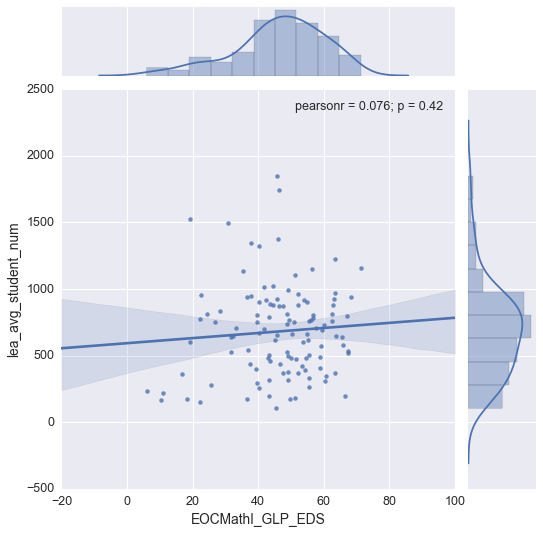

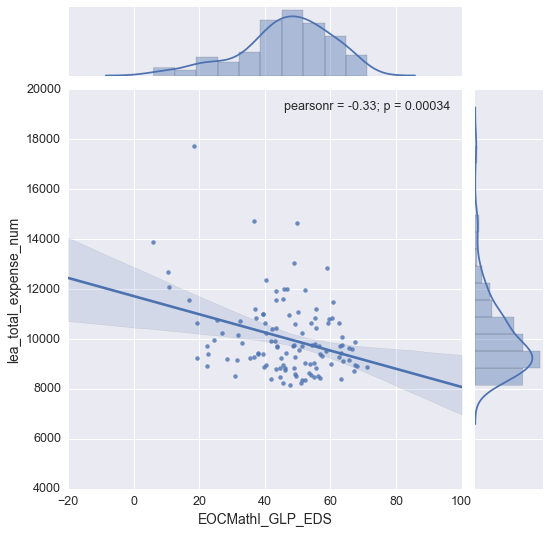

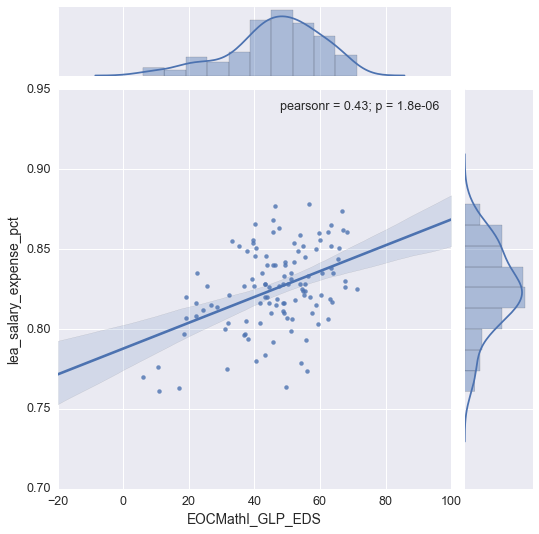

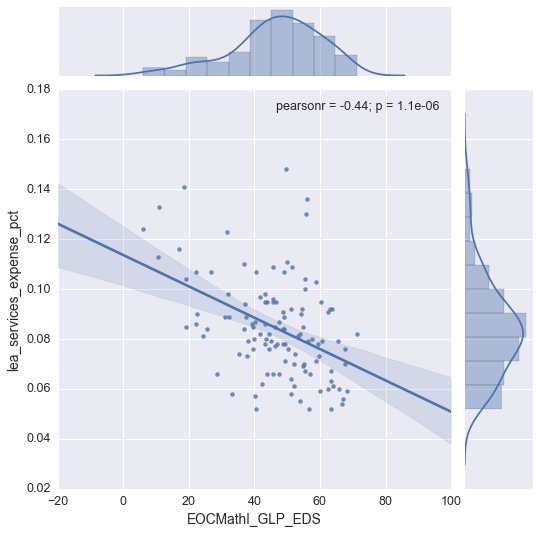

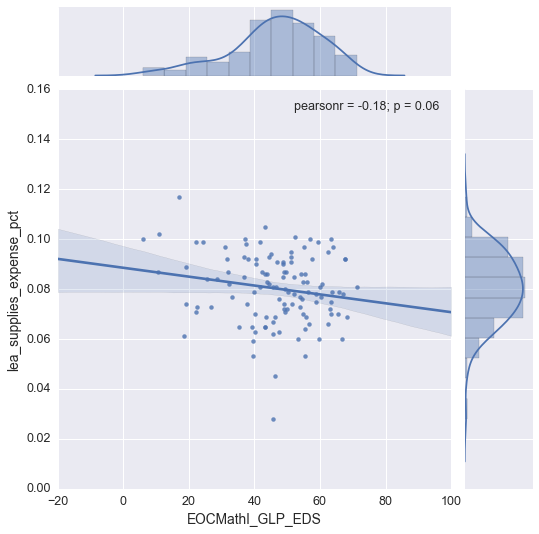

...

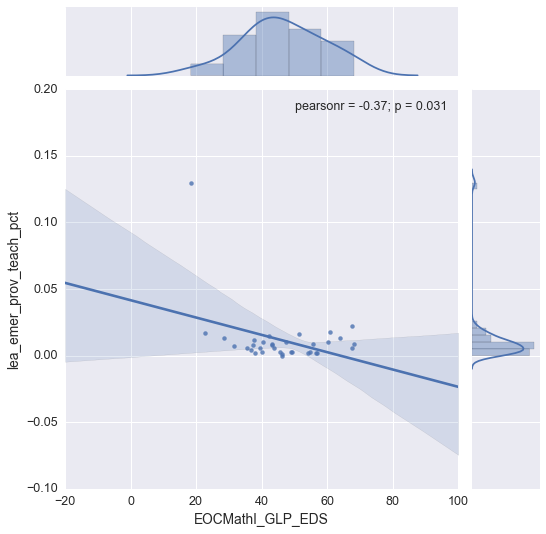

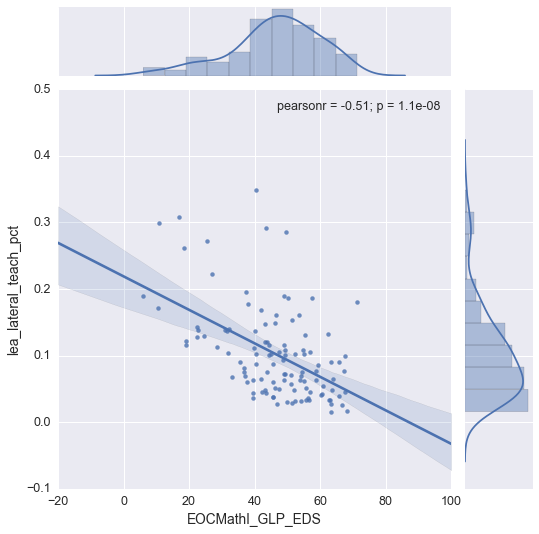

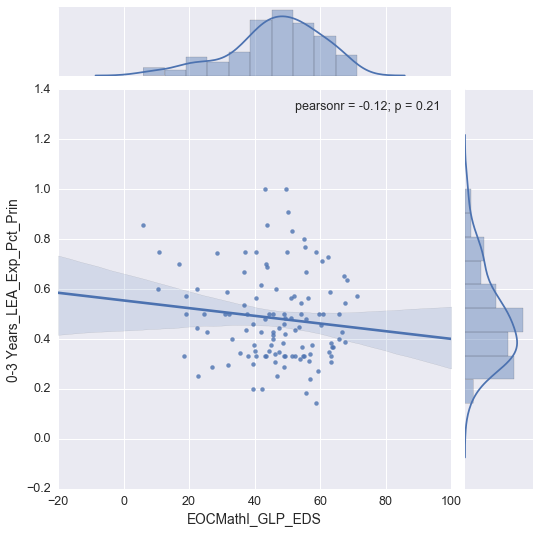

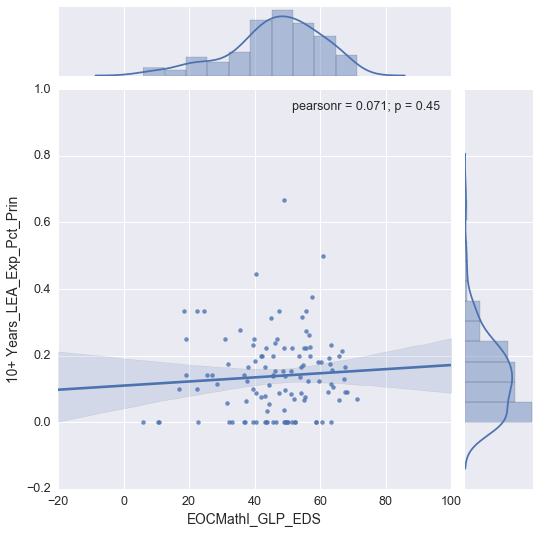

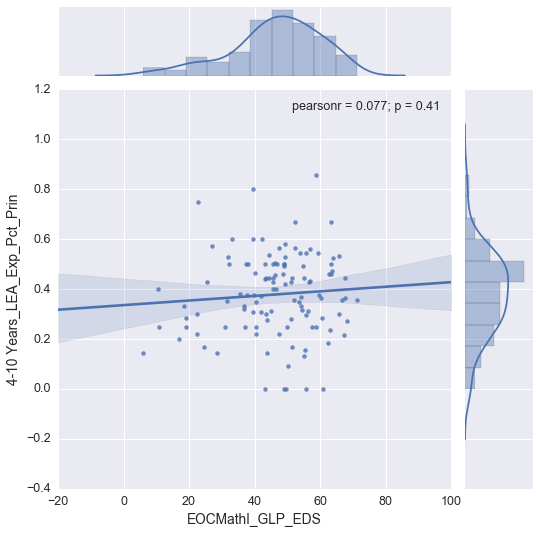

In [21]:
#Create district level charts to compare against number of dependents
for col in leaCols:
    try:
        PlotJoint(x='EOCMathI_GLP_EDS',y=col, data=distSchoolData)
    except Exception:
        continue

## District Level Relationships with Math I Grade Level Proficiency (GLP) for Students with Disabilities 
** The following charts explore the relationship between a school district's average Biology Grade Level Proficiency (GLP) Benchmarks for students with disabilities and various school district statistics.** 


**Key points to remember:** 
* Correlations are statistically significant at α = 0.05 or lower: they are (highly) unlikely and thus refute the null hypothesis of a zero population correlation.
* Correlations are never lower than -1. A correlation of -1 indicates that the data points in a scatter plot lie exactly on a straight descending line; the two variables are perfectly negatively linearly related.
* A correlation of 0 means that two variables don't have any linear relation whatsoever. However, some non linear relation may exist between the two variables.
* Correlation coefficients are never higher than 1. A correlation coefficient of 1 means that two variables are perfectly positively linearly related; the dots in a scatter plot lie exactly on a straight ascending line.
* Pct of Farm Returns = Number of farm returns All / Number of returns All  

**Key observations include statistically significant positive / negative correlations and are as follows: **
* District average student numbers increase as Average Math I Grade Level Proficiency (GLP) for students with disabilities students increases.
* District supplies as a percent of total expenses decrease as Average Math I Grade Level Proficiency (GLP) for students with disabilities students increases.
* District federal funding per pupil decreases as Average Math I Grade Level Proficiency (GLP) for students with disabilities students increases.
* District state funding per pupil decreases as Average Math I Grade Level Proficiency (GLP) for students with disabilities students increases.
* District average SAT scores increase as Average Math I Grade Level Proficiency (GLP) for students with disabilities students increases.
* District AP participation percentages increase as Average Math I Grade Level Proficiency (GLP) for students with disabilities students increases.
* District AP pct 3 or above increases as Average Math I Grade Level Proficiency (GLP) for students with disabilities students increases.
* District AP IB courses increase significantly as Average Math I Grade Level Proficiency (GLP) for students with disabilities students increases.
* District univ college courses decrease as Average Math I Grade Level Proficiency (GLP) for students with disabilities students increases.
* District crime, short and long term suspensions, and expulsions do not appear to be correlated with Average Math I Grade Level Proficiency (GLP) for students with disabilities students  changes. 
* District fully licensed teachers increase as Average Math I Grade Level Proficiency (GLP) for students with disabilities students increases.
* District teachers with 0-3 years experience decreases as Average Math I Grade Level Proficiency (GLP) for students with disabilities students increases.
* District teachers with 11+ years experience increases as Average Math I Grade Level Proficiency (GLP) for students with disabilities students increases.
* District class teacher numbers increases as Average Math I Grade Level Proficiency (GLP) for students with disabilities students increases.
* District average number of National Board Certified Staff increase as Average Math I Grade Level Proficiency (GLP) for students with disabilities students increases.
* District one year teacher turnover decreases as Average Math I Grade Level Proficiency (GLP) for students with disabilities students increases.
* District emer prov teacher percentages decreases as Average Math I Grade Level Proficiency (GLP) for students with disabilities students increases.
* District lateral entry teacher percentages decrease as Average Math I Grade Level Proficiency (GLP) for students with disabilities students increases.

### Click on the left side of the charts cell output below to expand all charts for viewing!

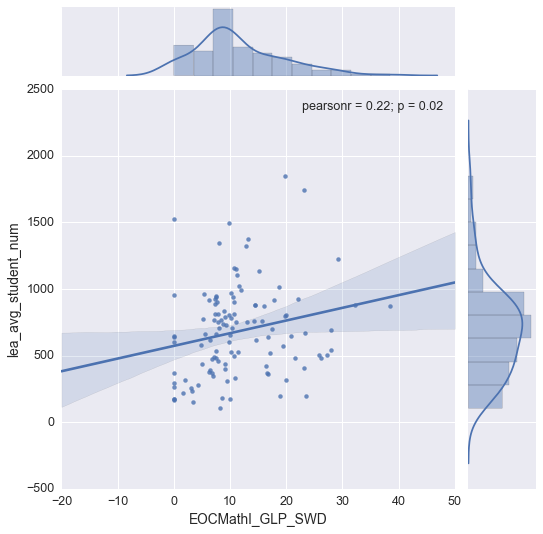

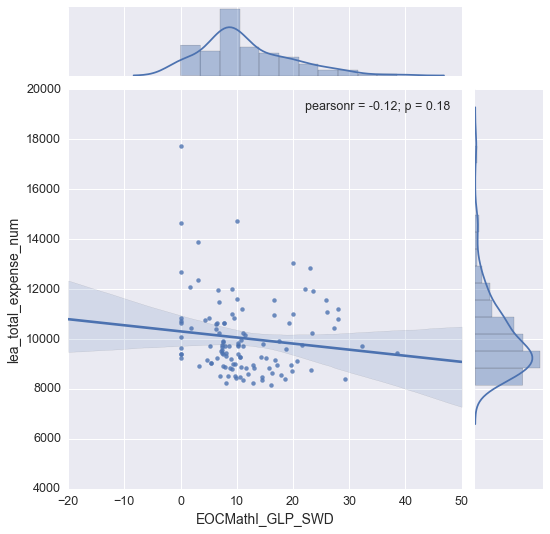

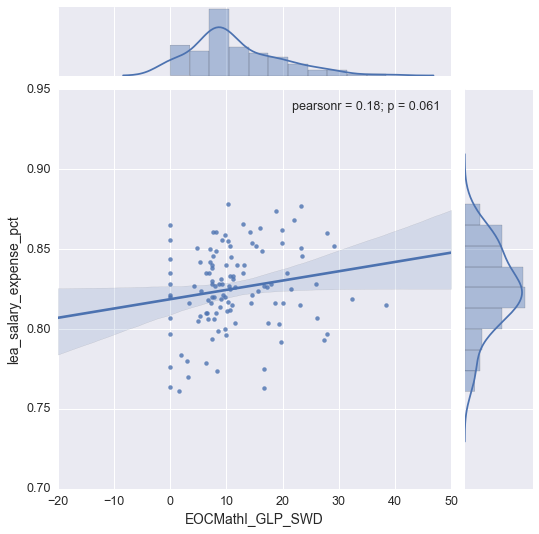

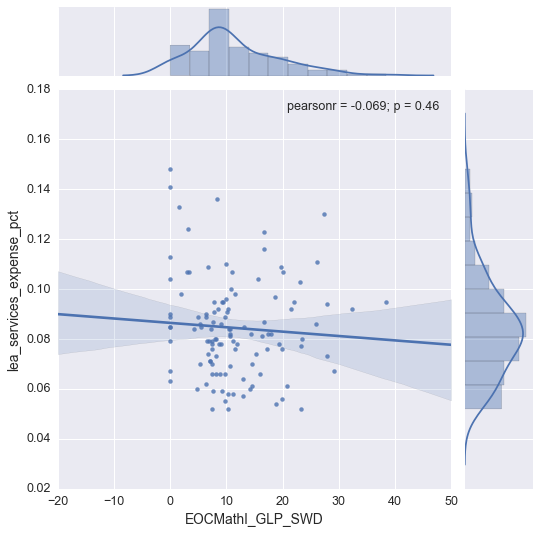

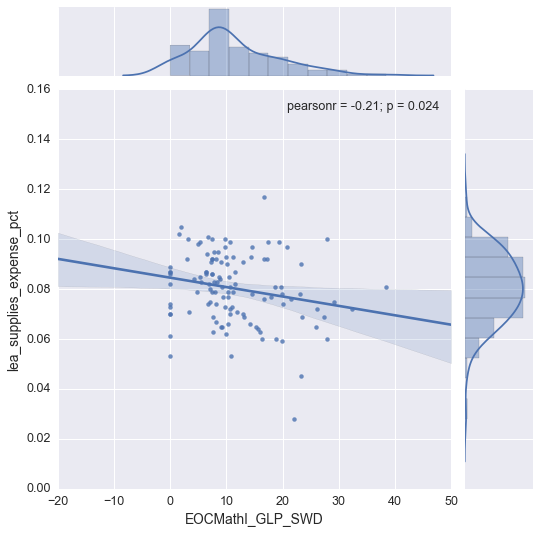

...

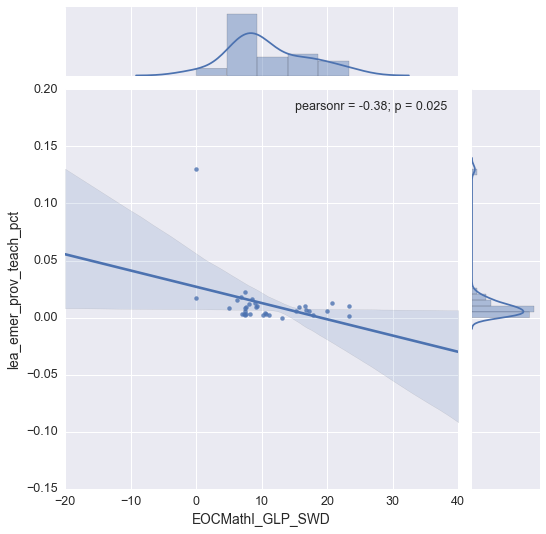

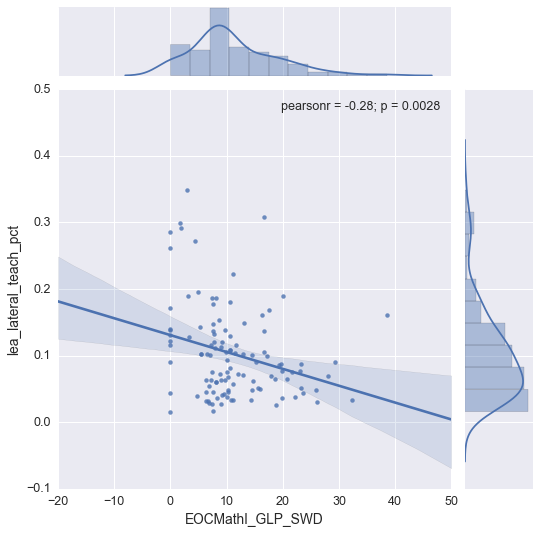

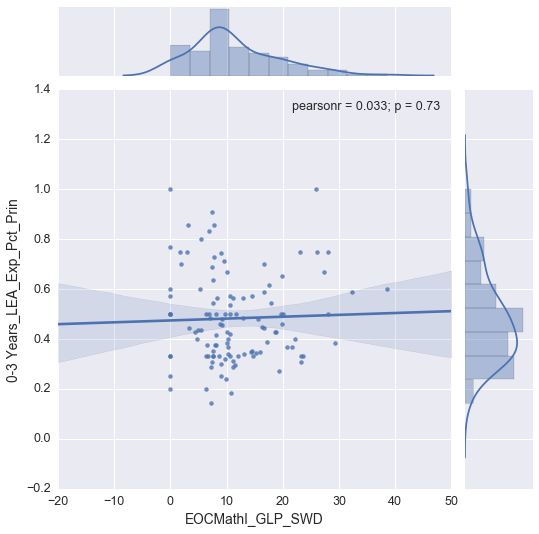

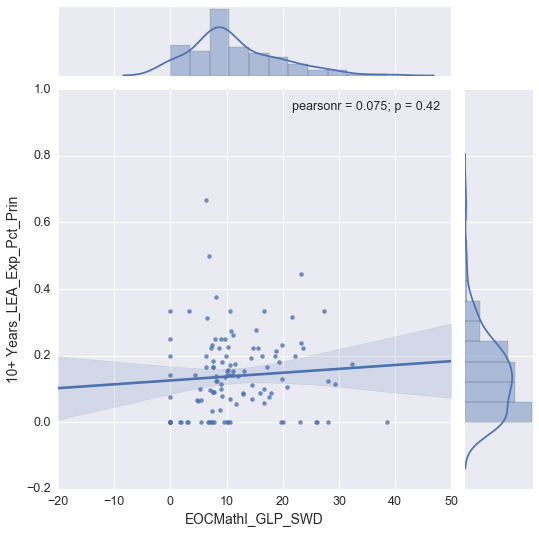

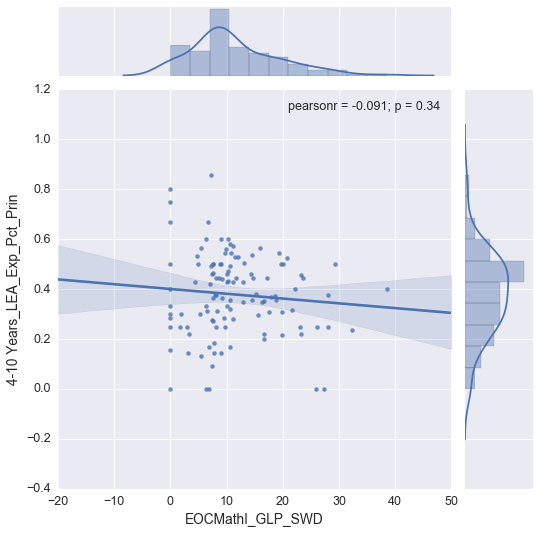

In [22]:
#Create district level charts to compare against number of dependents
for col in leaCols:
    try:
        PlotJoint(x='EOCMathI_GLP_SWD',y=col, data=distSchoolData)
    except Exception:
        continue